First of all, we will introduce how to create a `noise_image`

## 1. Create a noise image

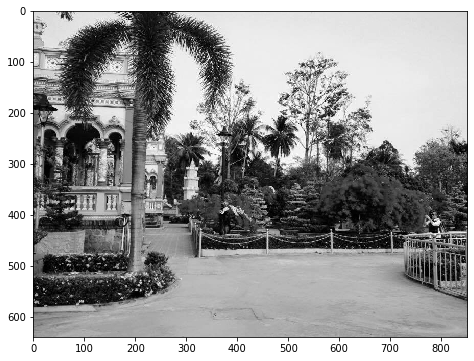

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_normal = cv2.imread(r"C:\Users\Admin\Desktop\Nhan_pro\Data\computer_vision_data\fig3.jpg", 0)
plt.figure(figsize = (10, 6))
plt.imshow(img_normal, 'gray')
plt.show()

Adding a `random_noise`:

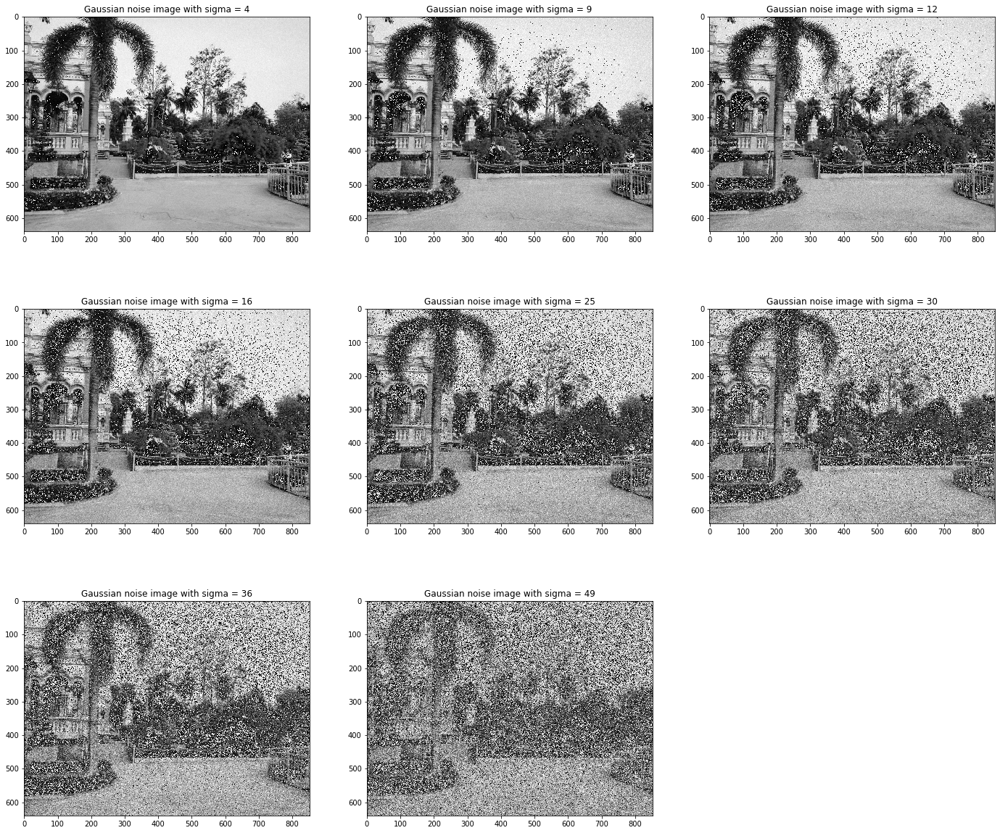

Wall time: 1.63 s


In [2]:
def noise_show(img_scr, var_ls, nrows = 2, fs = (20, 9)):
    """
    Input:
        img_scr: (array) image_source
        var_ls: (list of integer) the variances of random_noises
        nrows : number of rows in ploting
        fs (tuple): figsize
    Return:
        subplots of the noise_image
    """
    ncols = int(np.ceil(len(var_ls) / nrows))
    plt.figure(figsize = fs)
    k = 0
    for var in var_ls:
        plt.subplot(nrows, ncols, k+1)        
        noise = np.random.normal(0, var, img_scr.shape)
        noise = noise + img_scr
        noise = [np.uint8(i) for i in noise]
        plt.imshow(noise, 'gray')
        plt.title('Gaussian noise image with sigma = %s'%(var))
        k += 1
    plt.show()

%time noise_show(img_normal, [4, 9, 12, 16, 25, 30, 36, 49], 3, (24, 21))

We can see that :**`the increasing of variance of Gaussian_noise make the "white noise" becomes clearer`**

----------------------------

There are many way to improve the noise image by using `denoising` and `bluring`

## 2. Using `fastNlMeansDenoising` & `GaussianBlur`
First of all, in `opencv.python`, the function `fastNlMeansDenoising` has 4 common arguments, they are:

- `h` : parameter deciding `filter strength`. Higher h value removes noise better, but removes details of image also. (10 is ok)
- `hForColorComponents` : same as h, but for color images only. (normally same as h)
- `templateWindowSize` : should be odd. (recommended 7)
- `searchWindowSize` : should be odd. (recommended 21)

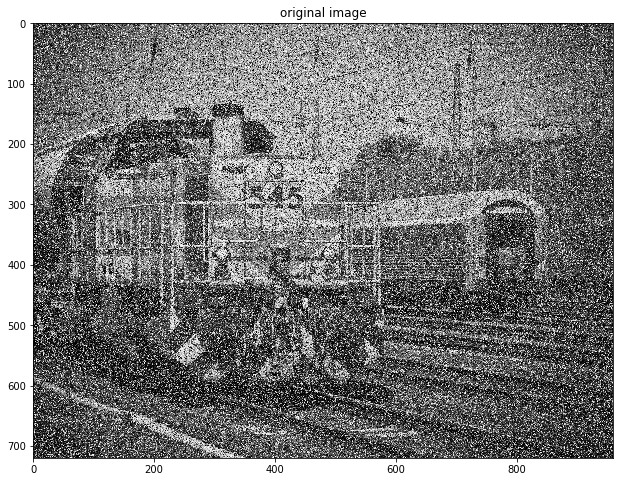

In [3]:
org_img_1 = cv2.imread(r"C:\Users\Admin\Desktop\Nhan_pro\Data\computer_vision_data\noise_img1.jpg", 0)

plt.figure(figsize = (15, 8))
plt.imshow(org_img_1, 'gray')
plt.title('original image')
plt.show()

We can guess the `sigma` (must be `odd`) of `random_noise` is too large, such as 49, 
- we put the `filter strength` is about `40` for using `cv2.fastNlMeansDenoising`
- and `sigma = 7` `ksize = 14` for using `cv2.GaussianBlur`

Wall time: 324 ms
Wall time: 0 ns


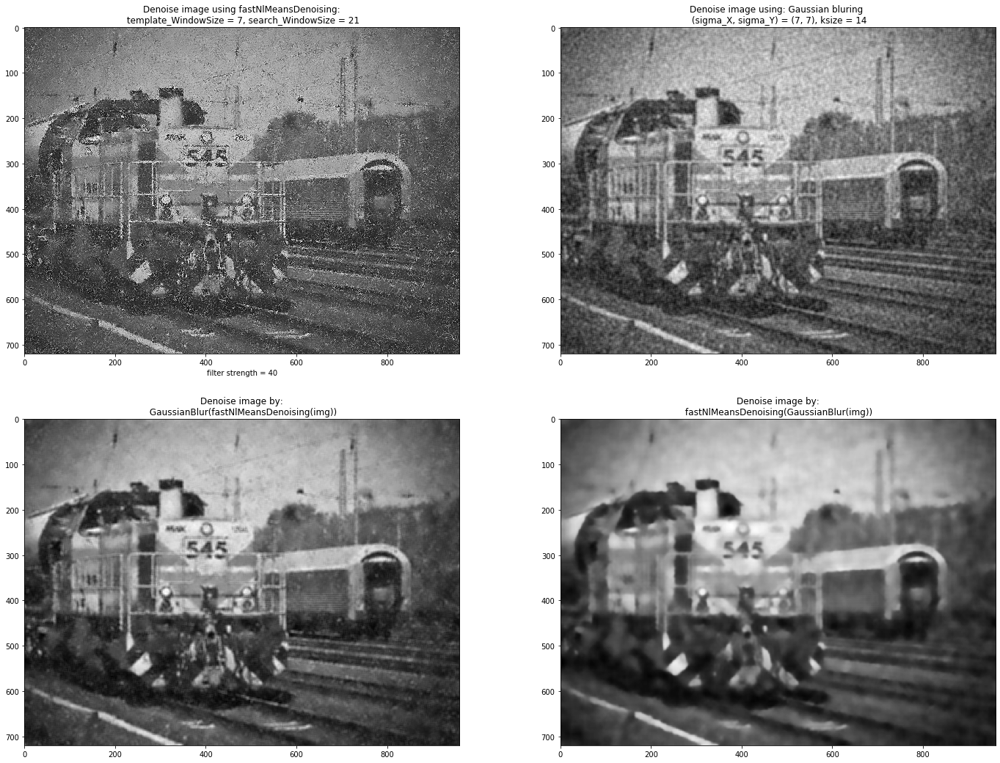

In [4]:
s, h, k = 7, 40, 14 
%time DN_img_1 = cv2.fastNlMeansDenoising(org_img_1, h, h, 7, 21)
DN_img_2 = cv2.GaussianBlur(org_img_1, (s, s), 2*k)
%time DN_img_3 = cv2.GaussianBlur(DN_img_1, (s, s), 2*k)
DN_img_4 = cv2.fastNlMeansDenoising(DN_img_2, h, h, 7, 21)

plt.figure(figsize = (24, 18))

plt.subplot(221), plt.imshow(DN_img_1, 'gray')
plt.title('Denoise image using fastNlMeansDenoising:\n template_WindowSize = 7, search_WindowSize = 21')
plt.xlabel('filter strength = %s'%(h))

plt.subplot(222), plt.imshow(DN_img_2, 'gray')
plt.title('Denoise image using: Gaussian bluring \n (sigma_X, sigma_Y) = (%s, %s), ksize = %s'%(s, s, k))

plt.subplot(223), plt.imshow(DN_img_3, 'gray')
plt.title('Denoise image by:\n GaussianBlur(fastNlMeansDenoising(img))')

plt.subplot(224), plt.imshow(DN_img_4, 'gray')
plt.title('Denoise image by:\n fastNlMeansDenoising(GaussianBlur(img))')

plt.show()

We can see last one is not good!

**Another illustration**

Wall time: 213 ms


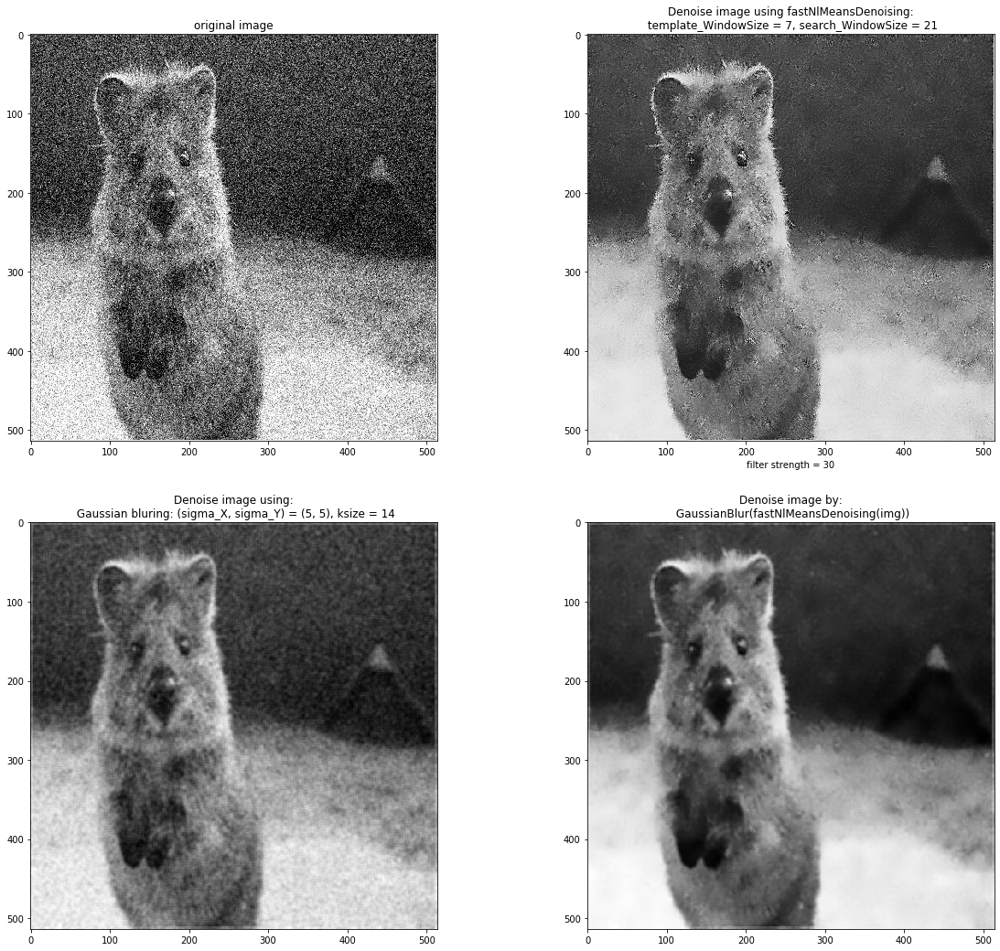

In [5]:
s, h, k = 5, 30, 14
org_img_2 = cv2.imread(r"C:\Users\Admin\Desktop\Nhan_pro\Data\computer_vision_data\noise_img2.jpg", 0)
%time DN_img_1 = cv2.fastNlMeansDenoising(org_img_2, h, h, 7, 21)
DN_img_2 = cv2.GaussianBlur(org_img_2, (s, s), k)
DN_img_3 = cv2.GaussianBlur(DN_img_1, (s, s), k)

plt.figure(figsize = (20, 18))
plt.subplot(221), plt.imshow(org_img_2, 'gray'), plt.title('original image')

plt.subplot(222), plt.imshow(DN_img_1, 'gray')
plt.title('Denoise image using fastNlMeansDenoising:\n template_WindowSize = 7, search_WindowSize = 21')
plt.xlabel('filter strength = %s'%(h))

plt.subplot(223), plt.imshow(DN_img_2, 'gray')
plt.title('Denoise image using:\n Gaussian bluring: (sigma_X, sigma_Y) = (%s, %s), ksize = %s'%(s, s, k))

plt.subplot(224), plt.imshow(DN_img_3, 'gray')
plt.title('Denoise image by:\n GaussianBlur(fastNlMeansDenoising(img))')

plt.show()

### 2.1. Affect of `filter strength`

Now, we define a function

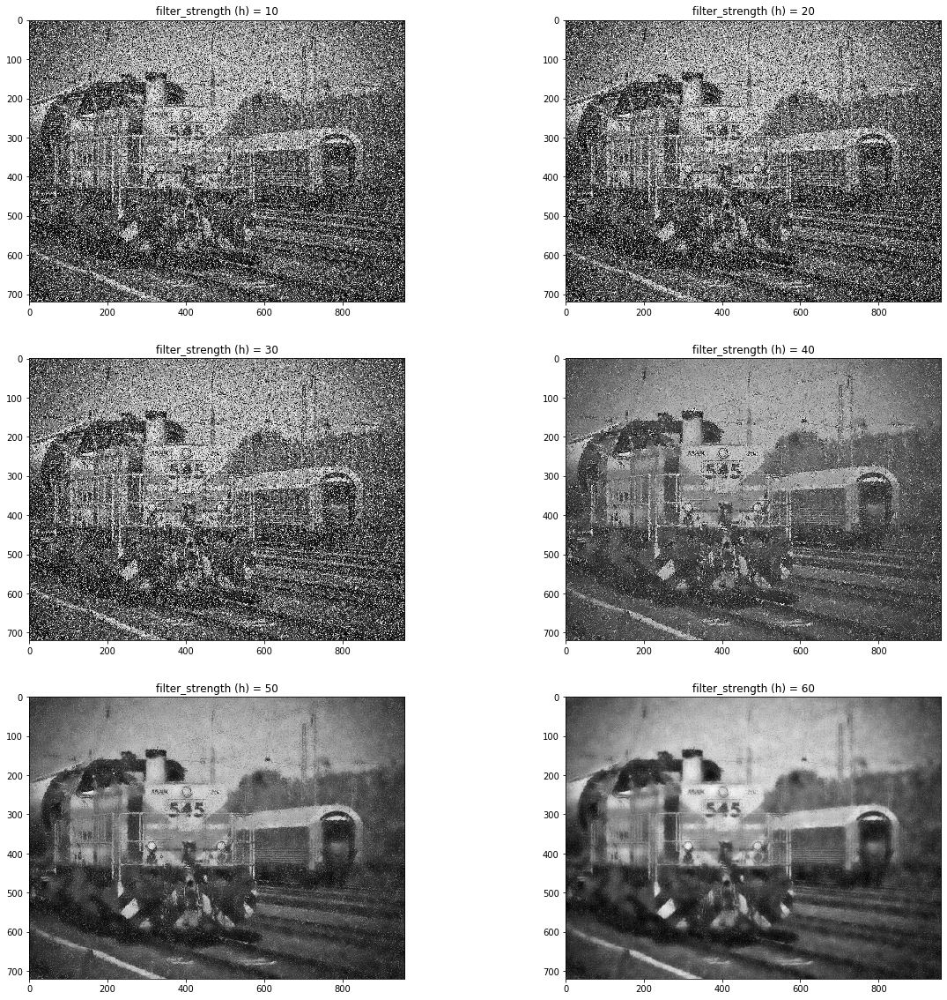

Wall time: 3.49 s


In [6]:
def filter_strength_vary_show(img_scr, filter_strength_ls, nrows, fs):
    """
    This function returns a subplots with in n_rows of vary filter_strength affects,
    Input:
        img_scr (array) : source of image
        filter_strength_ls (list): list of filter_strength
        nrows (int) : number of rows to display
        fs (tuple of 2 number): figsize
    """
    ncols = int(np.ceil(len(filter_strength_ls) / nrows))
    plt.figure(figsize = fs)
    k = 0
    for h in filter_strength_ls:
        plt.subplot(nrows, ncols, k+1) 
        new_img = cv2.fastNlMeansDenoising(img_scr, h, h, 7, 21)
        plt.imshow(new_img, 'gray')
        plt.title('filter_strength (h) = %s'%(h))
        k += 1
    plt.show()
    
%time filter_strength_vary_show(org_img_1, [10, 20, 30, 40, 50, 60], 3, (20, 20))

This is easy to see that the increasing `filter_strength` will removes noise better, but removes details of image also.

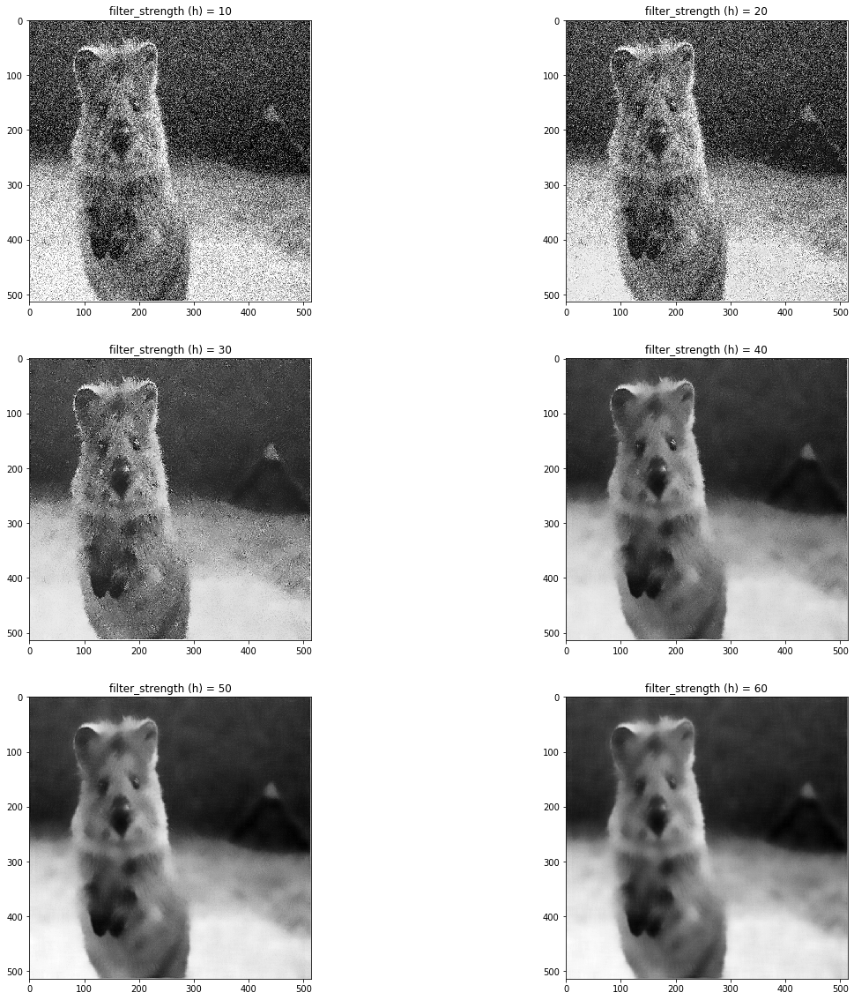

Wall time: 2.28 s


In [7]:
%time filter_strength_vary_show(org_img_2, [10, 20, 30, 40, 50, 60], 3, (20, 20))

### 2.2. Affect of `templateWindowSize`; fixed `filter_strength = 40` and `seacrh_window_Size = 21`

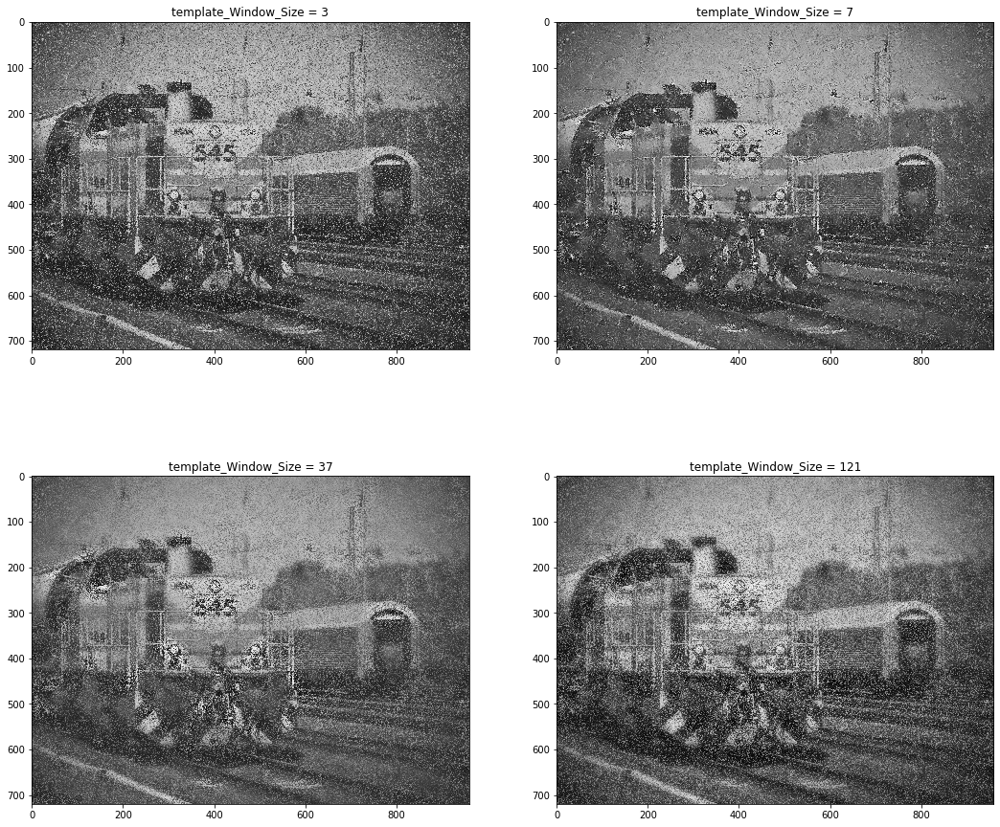

Wall time: 11.9 s


In [8]:
def template_WindowSize_vary_show(img_scr, template_Window_Size_ls, nrows, fs):
    """
    This function returns a subplots with in n_rows of vary filter_strength affects,
    Input:
        img_scr (array) : source of image
        template_Window_Size_ls (list): list of templateWindowSize
        nrows (int) : number of rows to display
        fs (tuple of 2 number): figsize
    """
    ncols = int(np.ceil(len(template_Window_Size_ls) / nrows))
    plt.figure(figsize = fs)
    k = 0
    for temp in template_Window_Size_ls:
        plt.subplot(nrows, ncols, k+1) 
        new_img = cv2.fastNlMeansDenoising(img_scr, 40, 40, temp, 21)
        plt.imshow(new_img, 'gray')
        plt.title('template_Window_Size = %s'%(temp))
        k += 1
    plt.show()
    
%time template_WindowSize_vary_show(org_img_1, [3, 7, 37, 121], 2, (18, 16))

Now, it is too hard to see the different when increasing `template_window_size`

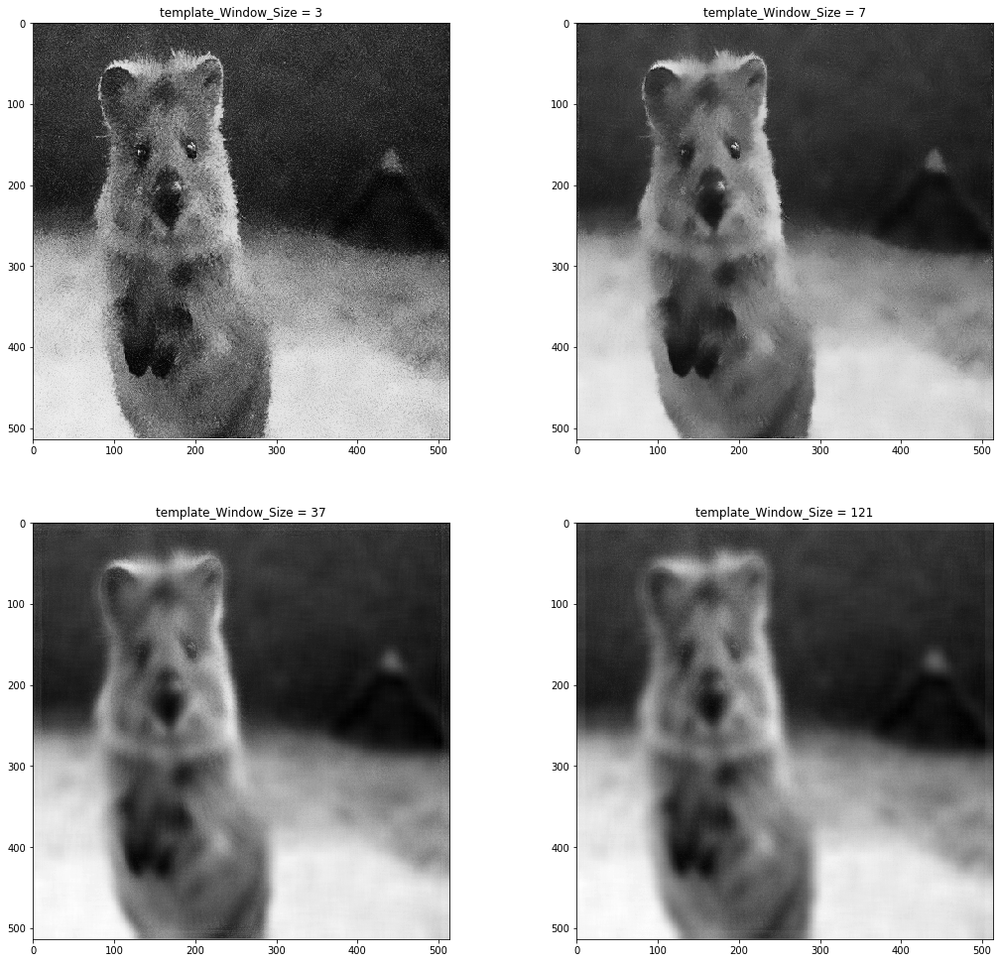

Wall time: 13.1 s


In [9]:
%time template_WindowSize_vary_show(org_img_2, [3, 7, 37, 121], 2, (18, 17))

And now then, we can conclude that the increasing of `template_window_size` over some `threshold` make the image to be collapsed

### 2.4 Affect of `searchWindowSize`

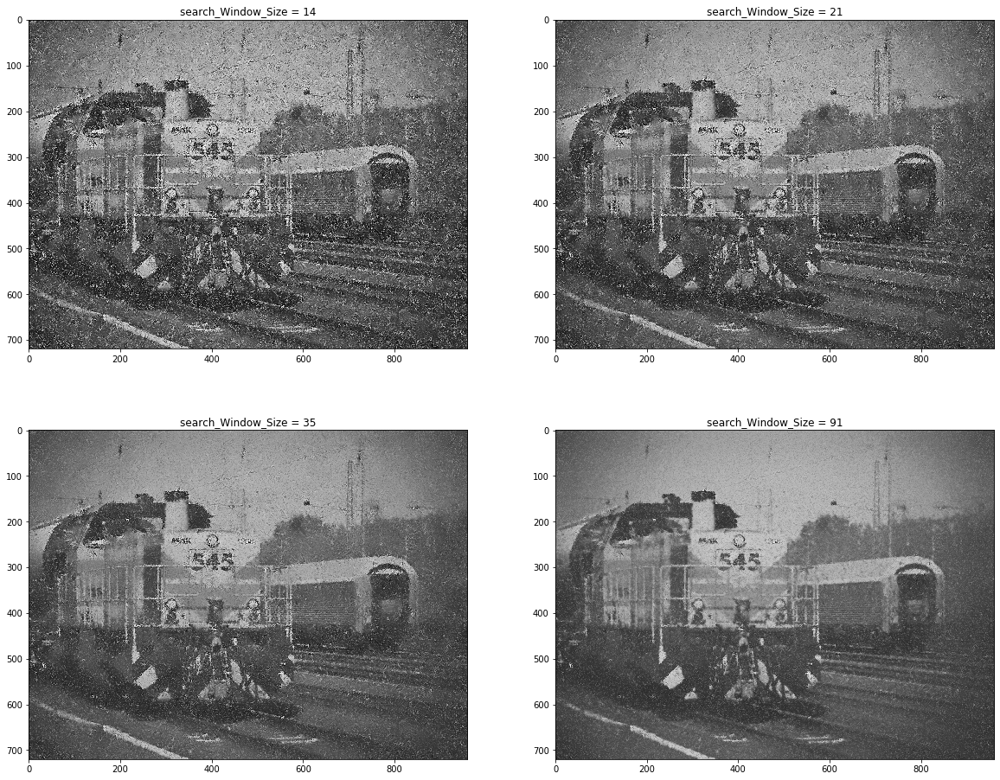

Wall time: 8.67 s


In [10]:
def search_WindowSize_vary_show(img_scr, search_Window_Size_ls, nrows, fs):
    """
    This function returns a subplots with in n_rows of vary filter_strength affects,
    Input:
        img_scr (array) : source of image
        search_Window_Size_ls (list): list of searchWindowSize
        nrows (int) : number of rows to display
        fs (tuple of 2 number): figsize
    """
    ncols = int(np.ceil(len(search_Window_Size_ls) / nrows))
    plt.figure(figsize = fs)
    k = 0
    for sws in search_Window_Size_ls:
        plt.subplot(nrows, ncols, k+1) 
        new_img = cv2.fastNlMeansDenoising(img_scr, 40, 40, 7, sws)
        plt.imshow(new_img, 'gray')
        plt.title('search_Window_Size = %s'%(sws))
        k += 1
    plt.show()
    
%time search_WindowSize_vary_show(org_img_1, [14, 21, 35, 91], 2, (20, 16))

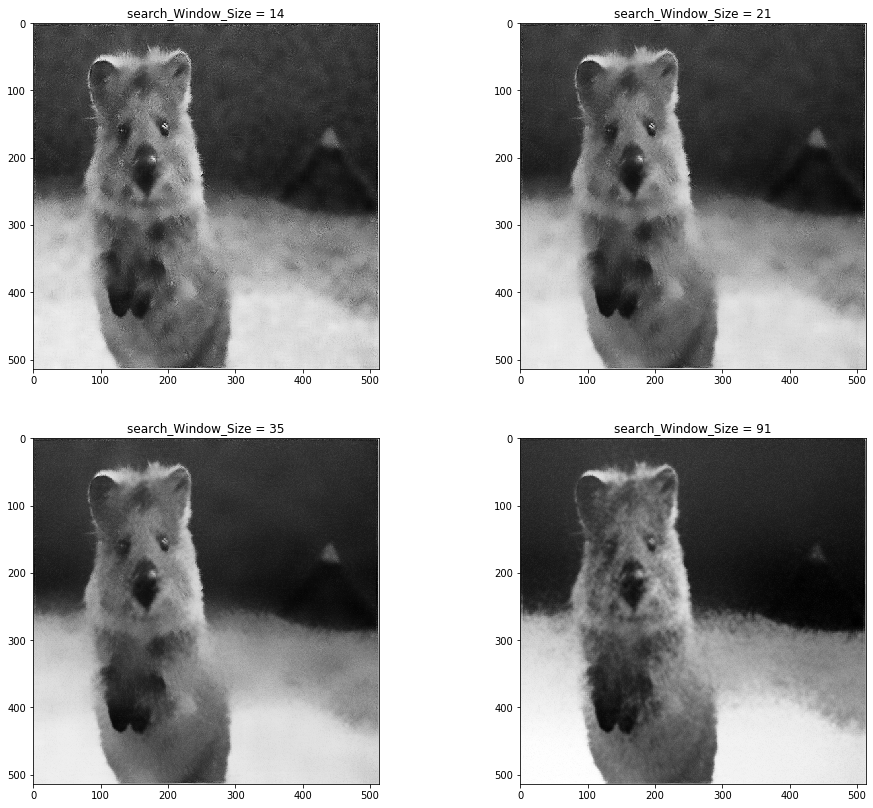

Wall time: 5.86 s


In [11]:
%time search_WindowSize_vary_show(org_img_2, [14, 21, 35, 91], 2, (16, 14))

### 2.5. Affect of `sigma`

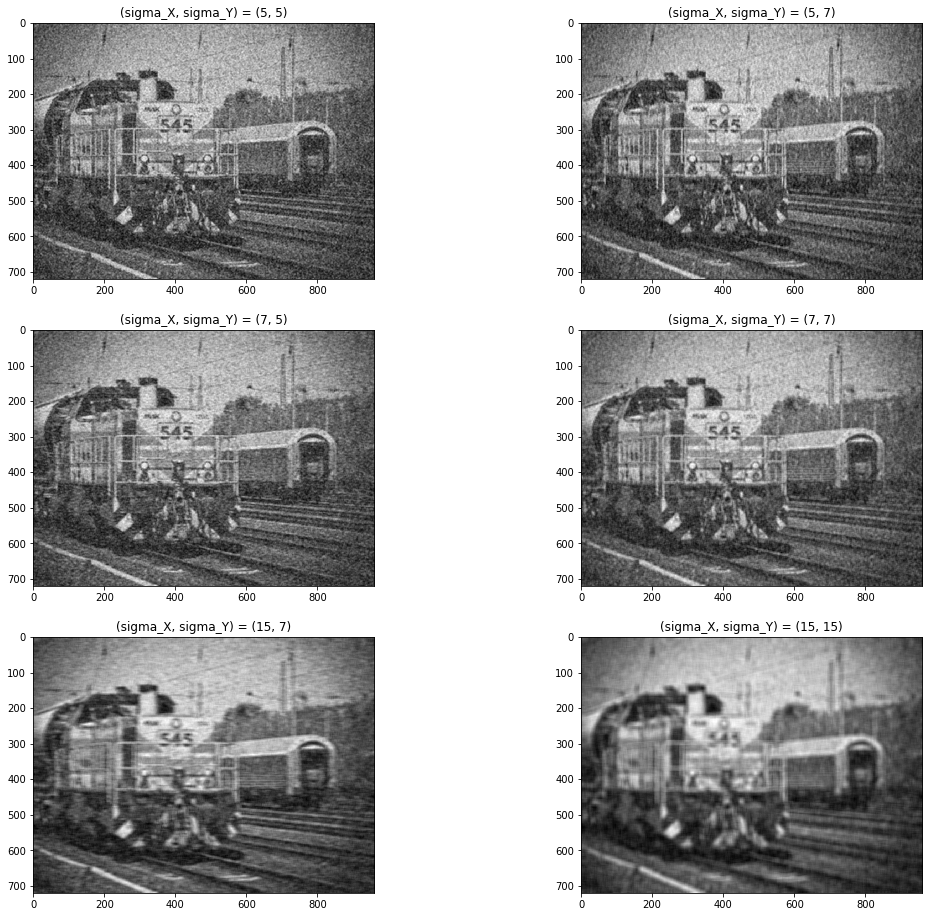

Wall time: 927 ms


In [12]:
def sigma_gaussianblur_vary_show(img_scr, sigma_ls, nrows, fs):
    """
    This function returns a subplots with in n_rows of vary filter_strength affects,
    Input:
        img_scr (array) : source of image
        sigma_ls (list of tuple): list of tuple(sigma_x, sigma_y)
        nrows (int) : number of rows to display
        fs (tuple of 2 number): figsize
    """
    ncols = int(np.ceil(len(sigma_ls) / nrows))
    plt.figure(figsize = fs)
    k = 0
    for sigma in sigma_ls:
        plt.subplot(nrows, ncols, k+1) 
        new_img = cv2.GaussianBlur(img_scr, sigma, 14)
        plt.imshow(new_img, 'gray')
        plt.title('(sigma_X, sigma_Y) = (%s, %s)'%(sigma))
        k += 1
    plt.show()
    
%time sigma_gaussianblur_vary_show(org_img_1, [(5, 5), (5, 7), (7,5), (7, 7), (15, 7), (15, 15)], 3, (18, 16))

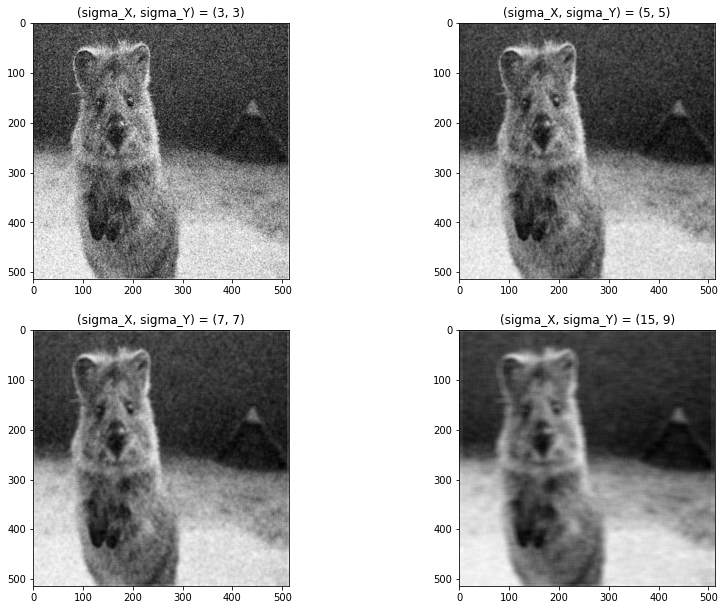

Wall time: 560 ms


In [13]:
%time sigma_gaussianblur_vary_show(org_img_2, [(3, 3), (5, 5), (7, 7), (15, 9)], 3, (14, 16))

### 2.6. Affect of `ksize`

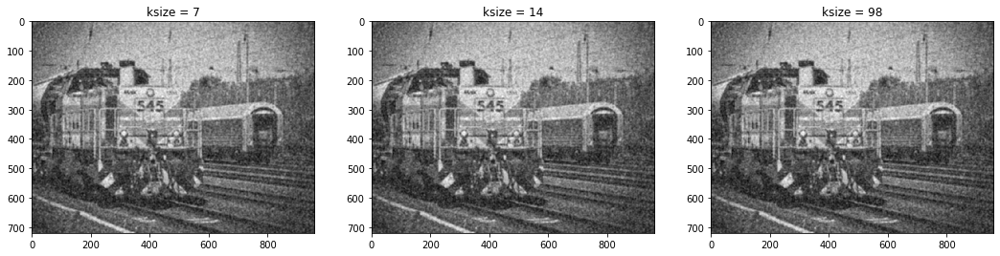

Wall time: 409 ms


In [14]:
def ksize_gaussianblur_vary_show(img_scr, ksize_ls, nrows, fs):
    """
    This function returns a subplots with in n_rows of vary filter_strength affects,
    Input:
        img_scr (array) : source of image
        ksize_ls (list of tuple): list of ksizes
        nrows (int) : number of rows to display
        fs (tuple of 2 number): figsize
    """
    ncols = int(np.ceil(len(ksize_ls) / nrows))
    plt.figure(figsize = fs)
    k = 0
    for ks in ksize_ls:
        plt.subplot(nrows, ncols, k+1) 
        new_img = cv2.GaussianBlur(img_scr, (7, 7), ks)
        plt.imshow(new_img, 'gray')
        plt.title('ksize = %s'%(ks))
        k += 1
    plt.show()
    
%time ksize_gaussianblur_vary_show(org_img_1, [7, 14, 98], 1, (18, 6))

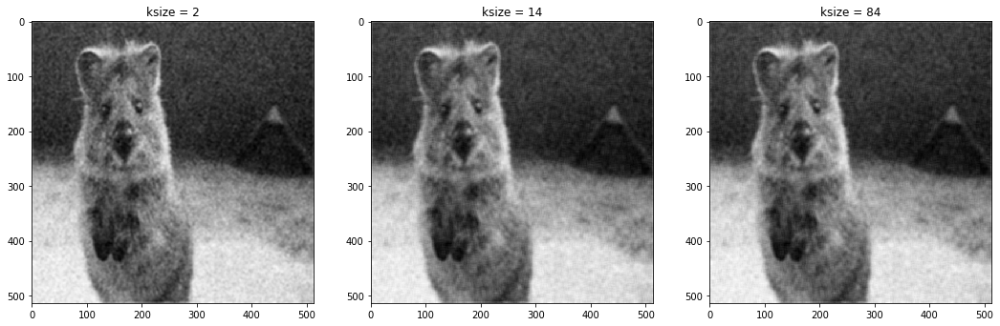

Wall time: 454 ms


In [15]:
%time ksize_gaussianblur_vary_show(org_img_2, [2, 14, 84], 1, (18, 6))